# Import necessary packages and dataset

In [ ]:
## Developed by Dr. Helen Lu, helen.lu@auckland.ac.nz copyright (c) 2024
# BUSINFO716 Assignment One Code for Student
# University of Auckland

# Import necessary libraries
import pandas as pd
from scipy.stats import ttest_ind
import numpy as np
from sklearn.linear_model import LogisticRegression
import statsmodels.api as sm
from scipy import stats
import sklearn.metrics as metrics
from sklearn.metrics import accuracy_score, precision_score, roc_auc_score, recall_score
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import RocCurveDisplay
import lightgbm as lgb
from imblearn.ensemble import RUSBoostClassifier
import os
import seaborn as sns
import matplotlib.pyplot as plt
#import pickle to save trained model
import pickle

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# read in data
data_all = pd.read_stata("/content/drive/MyDrive/Colab Notebooks/716/Assignment 1/assignment_one_student_data.dta", index_col="index")
data_all = data_all.dropna() # drop NA values
print(data_all.columns)
print(data_all.describe())
data_all.head()

Index(['gvkey', 'fyear', 'ceo_turnover', 'forcedturnover', 'voluntaryturnover',
       'ret_idio_l1', 'ret_peer_l1', 'risk_idio_l1', 'risk_peer_l1', 'ceoage',
       'tenure', 'ceoownership', 'ceofounder', 'ceoduality', 'inddir_pct_l1',
       'boardsize_l1', 'female', 'ivyleague', 'mba', 'phd', 'bkgdacademic',
       'bkgdfinance', 'bkgdhr', 'bkgdlaw', 'bkgdmanager', 'bkgdmarketing',
       'bkgdmilitary', 'bkgdpolitician', 'bkgdscience', 'bkgdtech', 'private',
       'armedforces', 'charities', 'clubs', 'government', 'partnership',
       'quoted', 'sporting', 'universities', 'firmsize_l1', 'cashflow_l1',
       'profitability_l1', 'divpayer_l1', 'roa_ind_adj_l1', 'ind_roa_l1',
       'delta_l1', 'vega_l1', 'rdintensity_l1', 'tangibility_l1'],
      dtype='object')
               gvkey         fyear  ceo_turnover  forcedturnover  \
count   31134.000000  31134.000000  31134.000000     31134.00000   
mean    33338.398021   2005.600276      0.141967         0.02849   
std     47333.6364

,gvkey,fyear,ceo_turnover,forcedturnover,voluntaryturnover,ret_idio_l1,ret_peer_l1,risk_idio_l1,risk_peer_l1,ceoage,...,firmsize_l1,cashflow_l1,profitability_l1,divpayer_l1,roa_ind_adj_l1,ind_roa_l1,delta_l1,vega_l1,rdintensity_l1,tangibility_l1
index,,,,,,,,,,,,,,,,,,,,,
2.0,1004,1993,0,0.0,0.0,-0.279057,0.406166,0.286543,0.078804,63.411362,...,19.715822,0.047498,0.063675,1.0,-0.009309,0.010084,58.525604,0.000000,0.002739,0.153504
3.0,1004,1994,0,0.0,0.0,-0.181724,0.266025,0.222565,0.093286,64.410678,...,19.850098,0.036736,0.069694,1.0,0.000894,0.021815,61.357243,0.000000,0.002394,0.131177
4.0,1004,1995,1,0.0,1.0,-0.312487,0.434342,0.234994,0.076116,65.412731,...,19.869513,0.046067,0.081646,1.0,-0.001856,0.026428,78.507370,9.383804,0.002348,0.132912
5.0,1004,1996,0,0.0,0.0,0.161776,0.281854,0.285152,0.142196,44.410678,...,19.897377,0.057488,0.097196,1.0,0.000649,0.035920,123.956108,11.273930,0.002284,0.125229
6.0,1004,1997,0,0.0,0.0,0.187938,0.252164,0.339003,0.143629,45.409993,...,20.087603,0.065034,0.104189,1.0,0.007907,0.035570,150.126831,34.158154,0.001888,0.134271


In [ ]:
unique_gvkey_count = data_all['gvkey'].nunique()
print(unique_gvkey_count)

2538


In [ ]:
data_all['fyear'].unique()

array([1993, 1994, 1995, 1996, 1997, 1998, 1999, 2000, 2001, 2002, 2003,
       2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014,
       2015, 2016, 2017], dtype=int32)

In [ ]:
data_all['forcedturnover'].value_counts()

0.0    30247
1.0      887
Name: forcedturnover, dtype: int64

In [ ]:
data_all.info()

<class 'pandas.core.frame.DataFrame'>
Float64Index: 31134 entries, 2.0 to 40178.0
Data columns (total 49 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   gvkey              31134 non-null  int32  
 1   fyear              31134 non-null  int32  
 2   ceo_turnover       31134 non-null  int32  
 3   forcedturnover     31134 non-null  float64
 4   voluntaryturnover  31134 non-null  float64
 5   ret_idio_l1        31134 non-null  float32
 6   ret_peer_l1        31134 non-null  float32
 7   risk_idio_l1       31134 non-null  float32
 8   risk_peer_l1       31134 non-null  float32
 9   ceoage             31134 non-null  float64
 10  tenure             31134 non-null  float64
 11  ceoownership       31134 non-null  float64
 12  ceofounder         31134 non-null  int32  
 13  ceoduality         31134 non-null  float64
 14  inddir_pct_l1      31134 non-null  float32
 15  boardsize_l1       31134 non-null  float32
 16  female          

In [ ]:
data_all.to_csv("data_all.csv", mode='w', index=False)

# Exploratory Data Analysis

In [ ]:
data_all['fyear'].min()


1993

In [ ]:
data_all['ceo_turnover'].value_counts()


0    26714
1     4420
Name: ceo_turnover, dtype: int64

In [ ]:
data_all['forcedturnover'].value_counts() # assessing number of forced

0.0    30247
1.0      887
Name: forcedturnover, dtype: int64

In [ ]:
data_all['voluntaryturnover'].value_counts()

0.0    27601
1.0     3533
Name: voluntaryturnover, dtype: int64

In [ ]:
#############################################################
## compare summary statistics of normal, forced and voluntary
#############################################################
# generate a new dataframe containing all forced ceo turnovers
data_forced = data_all.loc[data_all['forcedturnover'] == 1, :]
# generate a new dataframe containing all voluntary ceo turnovers
data_voluntary = data_all.loc[data_all['voluntaryturnover'] == 1, :]
# generate a non-turnover dataset
data_normal = data_all.loc[data_all['ceo_turnover']==0 , :]

## difference in means tests (forced - voluntary)
# Create an empty DataFrame to store the results
diff_results = pd.DataFrame(columns=['column', 'normal', 'voluntary', 'forced', 'forced-voluntary','stars','t-stat'])
for col in data_forced.columns:

    # calculate means
    bench = data_normal[col].mean()
    forced = data_forced[col].mean()
    voluntary = data_voluntary[col].mean()

    # Calculate the difference between the means
    diff = data_forced[col].mean() - data_voluntary[col].mean()

    # Format means with two decimal points
    formatted_bench = format(bench, '.2f')
    formatted_forced = format(forced, '.2f')
    formatted_voluntary = format(voluntary, '.2f')
    formatted_diff = format(diff, '.2f')

    # difference in means test assuming unequal variances in two samples
    t_statistics, p_value = ttest_ind(data_forced[col], data_voluntary[col], equal_var= False)

    # Determine the number of stars based on the p-value
    if p_value < 0.01:
        stars = '***'
    elif p_value < 0.05:
        stars = '**'
    elif p_value < 0.1:
        stars = '*'
    else:
        stars = ''

    # Format the t-stat in means with two decimal points
    formatted_tstat = format(t_statistics, '.2f')

    # Add the results to a new DataFrame
    temp_df = pd.DataFrame({'column': col, 'normal': formatted_bench,'voluntary': formatted_voluntary,'forced': formatted_forced, 'forced-voluntary':formatted_diff,'stars':stars, 't-stat': formatted_tstat}, index=[0])

    # Concatenate the new DataFrame with the existing results DataFrame
    diff_results = pd.concat([diff_results, temp_df], ignore_index=True)

# Export the results to a CSV file
diff_results.to_csv("diff_results.csv", mode='w', index=False)

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:523: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  res = hypotest_fun_out(*samples, **kwds)
/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:523: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  res = hypotest_fun_out(*samples, **kwds)
/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:523: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  res = hypotest_fun_out(*samples, **kwds)


In [ ]:
diff_results

,column,normal,voluntary,forced,forced-voluntary,stars,t-stat
0,gvkey,32900.03,34763.17,40865.79,6102.62,***,3.14
1,fyear,2005.56,2005.63,2006.74,1.11,***,4.62
2,ceo_turnover,0.00,1.00,1.00,0.00,,nan
3,forcedturnover,0.00,0.00,1.00,1.00,***,inf
4,voluntaryturnover,0.00,1.00,0.00,-1.00,***,-inf
5,ret_idio_l1,0.01,-0.01,-0.16,-0.15,***,-9.20
6,ret_peer_l1,0.19,0.20,0.18,-0.02,**,-2.17
7,risk_idio_l1,0.35,0.35,0.41,0.06,***,6.83
8,risk_peer_l1,0.18,0.17,0.18,0.01,***,3.53
9,ceoage,56.48,59.68,55.91,-3.76,***,-13.72


## Comparing means between Voluntary and Forced Turnovers

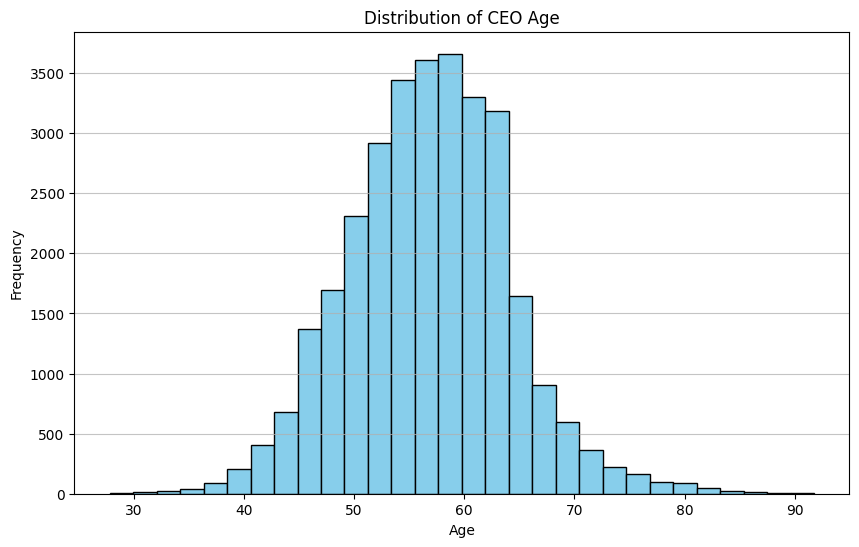

In [ ]:
# Re-import necessary libraries and reload the dataset since the code execution state was reset
import pandas as pd
import matplotlib.pyplot as plt


# Plotting the distribution of CEO ages
plt.figure(figsize=(10, 6))
plt.hist(data_all['ceoage'], bins=30, color='skyblue', edgecolor='black')
plt.title('Distribution of CEO Age')
plt.xlabel('Age')
plt.ylabel('Frequency')
plt.grid(axis='y', alpha=0.75)

plt.show()


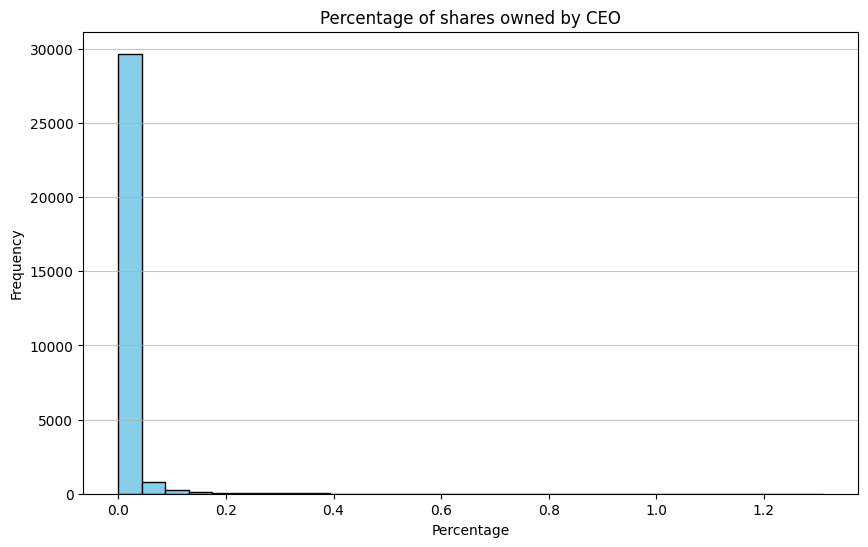

In [ ]:
# Re-import necessary libraries and reload the dataset since the code execution state was reset
import pandas as pd
import matplotlib.pyplot as plt


# Plotting the distribution of CEO ages
plt.figure(figsize=(10, 6))
plt.hist(data_all['ceoownership'], bins=30, color='skyblue', edgecolor='black')
plt.title('Percentage of shares owned by CEO')
plt.xlabel('Percentage')
plt.ylabel('Frequency')
plt.grid(axis='y', alpha=0.75)

plt.show()

In [ ]:
data_all['ceoownership'].max()

1.309757700720367

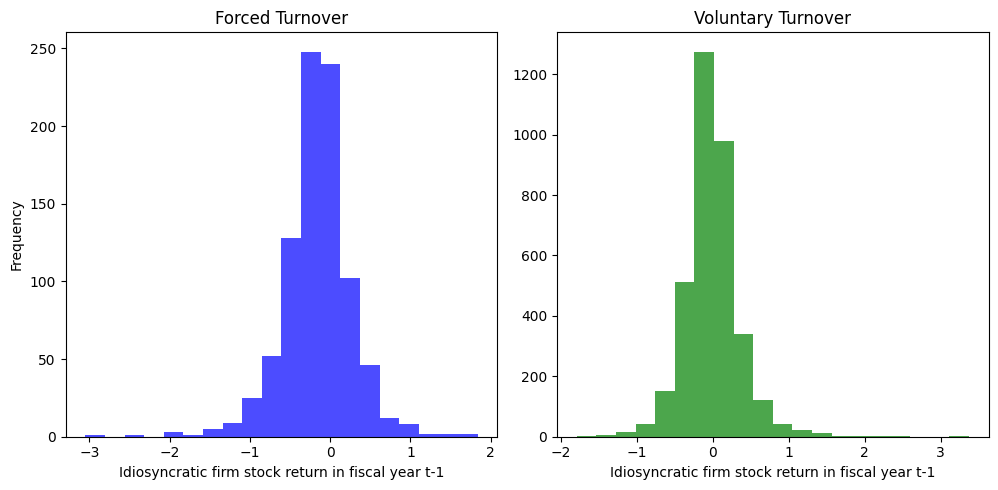

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt


# Assuming 'ret_idio_l1' is the column name containing the variable
variable_name = 'ret_idio_l1'

# Plotting side by side
plt.figure(figsize=(15, 5))

# Plot for data_forced
plt.subplot(1, 3, 1)
plt.hist(data_forced[variable_name], bins=20, color='blue', alpha=0.7)
plt.title('Forced Turnover')
plt.xlabel('Idiosyncratic firm stock return in fiscal year t-1')
plt.ylabel('Frequency')

# Plot for data_voluntary
plt.subplot(1, 3, 2)
plt.hist(data_voluntary[variable_name], bins=20, color='green', alpha=0.7)
plt.title('Voluntary Turnover')
plt.xlabel('Idiosyncratic firm stock return in fiscal year t-1')


plt.tight_layout()
plt.show()


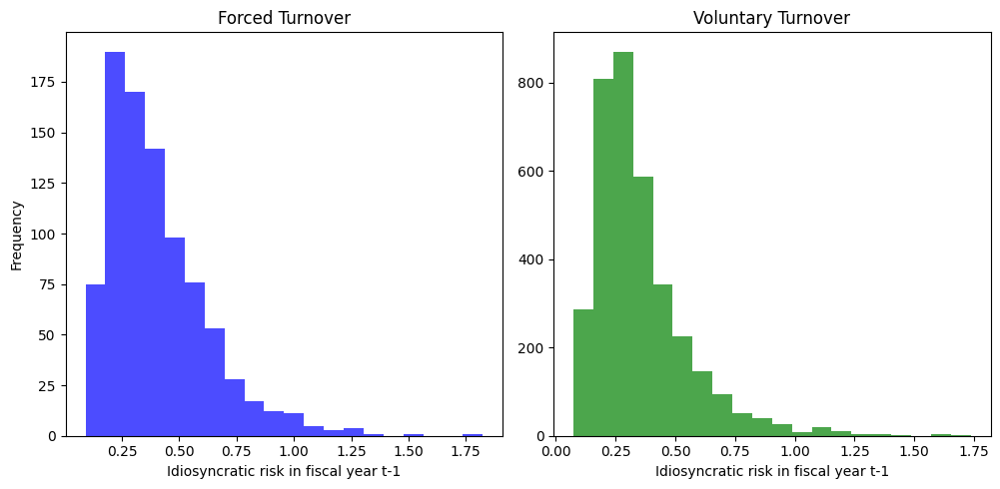

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

variable_name1 = 'risk_idio_l1'

# Plotting side by side
plt.figure(figsize=(15, 5))

# Plot for data_forced
plt.subplot(1, 3, 1)
plt.hist(data_forced[variable_name1], bins=20, color='blue', alpha=0.7)
plt.title('Forced Turnover')
plt.xlabel('Idiosyncratic risk in fiscal year t-1')
plt.ylabel('Frequency')

# Plot for data_voluntary
plt.subplot(1, 3, 2)
plt.hist(data_voluntary[variable_name1], bins=20, color='green', alpha=0.7)
plt.title('Voluntary Turnover')
plt.xlabel('Idiosyncratic risk in fiscal year t-1')


plt.tight_layout()
plt.show()

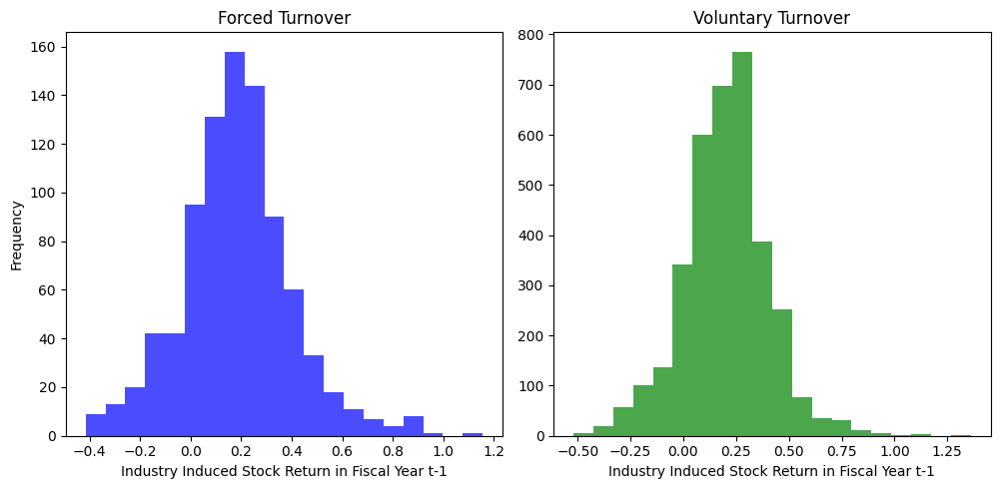

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

variable_name2 = 'ret_peer_l1'

# Plotting side by side
plt.figure(figsize=(15, 5))

# Plot for data_forced
plt.subplot(1, 3, 1)
plt.hist(data_forced[variable_name2], bins=20, color='blue', alpha=0.7)
plt.title('Forced Turnover')
plt.xlabel('Industry Induced Stock Return in Fiscal Year t-1')
plt.ylabel('Frequency')

# Plot for data_voluntary
plt.subplot(1, 3, 2)
plt.hist(data_voluntary[variable_name2], bins=20, color='green', alpha=0.7)
plt.title('Voluntary Turnover')
plt.xlabel('Industry Induced Stock Return in Fiscal Year t-1')


plt.tight_layout()
plt.show()

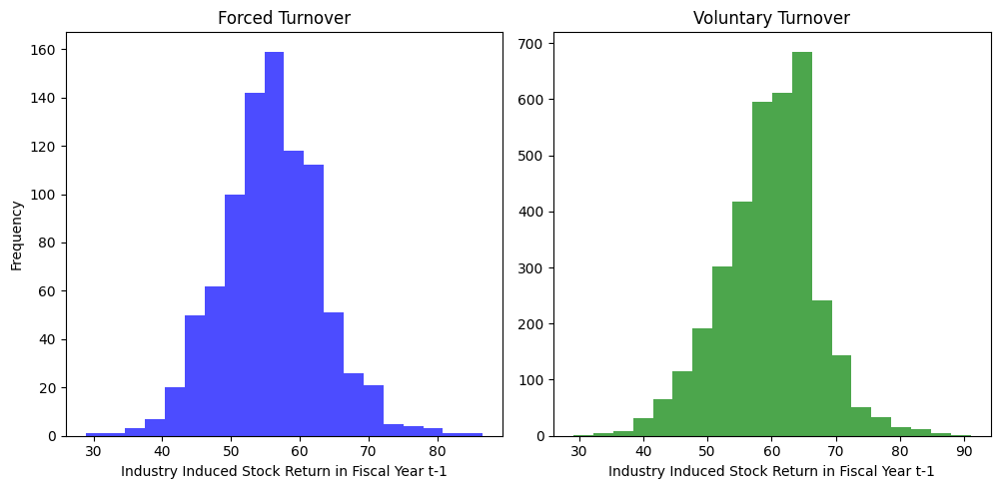

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

variable_name3 = 'ceoage'

# Plotting side by side
plt.figure(figsize=(15, 5))

# Plot for data_forced
plt.subplot(1, 3, 1)
plt.hist(data_forced[variable_name3], bins=20, color='blue', alpha=0.7)
plt.title('Forced Turnover')
plt.xlabel('Industry Induced Stock Return in Fiscal Year t-1')
plt.ylabel('Frequency')

# Plot for data_voluntary
plt.subplot(1, 3, 2)
plt.hist(data_voluntary[variable_name3], bins=20, color='green', alpha=0.7)
plt.title('Voluntary Turnover')
plt.xlabel('Industry Induced Stock Return in Fiscal Year t-1')


plt.tight_layout()
plt.show()

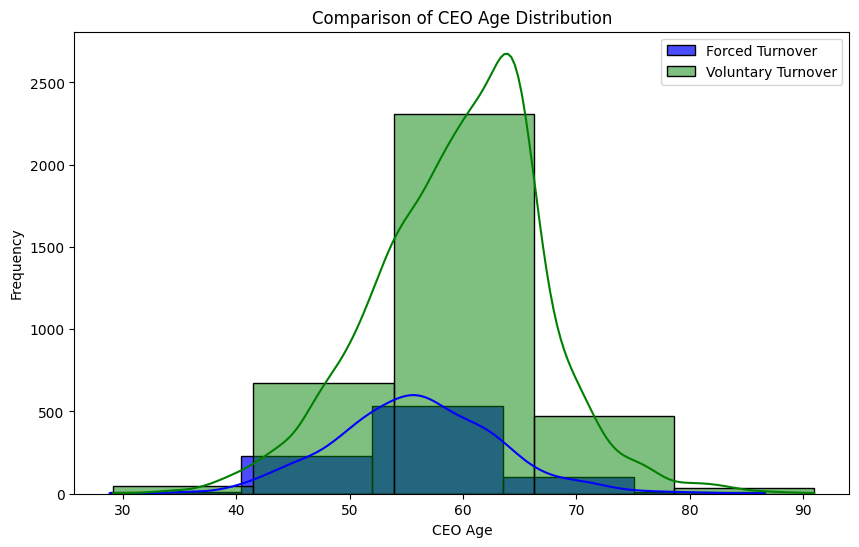

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt


# Set up the matplotlib figure
plt.figure(figsize=(10, 6))

# Plot the density and histogram for data_forced
sns.histplot(data_forced['ceoage'], bins=5, color='blue', alpha=0.7, kde=True, label='Forced Turnover')

# Plot the density and histogram for data_voluntary
sns.histplot(data_voluntary['ceoage'], bins=5, color='green', alpha=0.5, kde=True, label='Voluntary Turnover')


# Add title and labels
plt.title('Comparison of CEO Age Distribution')
plt.xlabel('CEO Age')
plt.ylabel('Frequency')

# Add legend
plt.legend()

# Show the plot
plt.show()


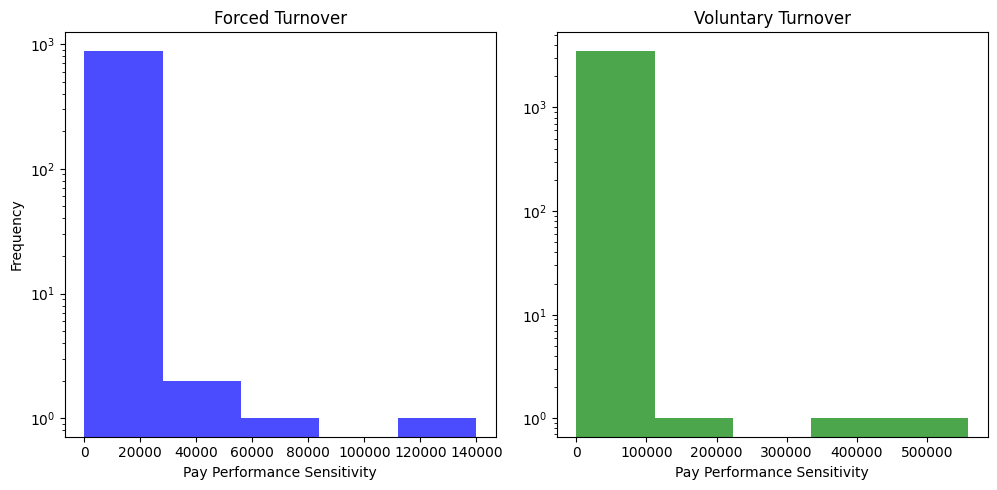

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt


# Plotting side by side
plt.figure(figsize=(15, 5))

# Plot for data_forced
plt.subplot(1, 3, 1)
plt.hist(data_forced['delta_l1'], bins=5, color='blue', alpha=0.7)
plt.yscale('log')  # Set y-axis to logarithmic scale
plt.title('Forced Turnover')
plt.xlabel('Pay Performance Sensitivity')
plt.ylabel('Frequency')

# Plot for data_voluntary
plt.subplot(1, 3, 2)
plt.hist(data_voluntary['delta_l1'], bins=5, color='green', alpha=0.7)
plt.yscale('log')  # Set y-axis to logarithmic scale
plt.title('Voluntary Turnover')
plt.xlabel('Pay Performance Sensitivity')


plt.tight_layout()
plt.show()


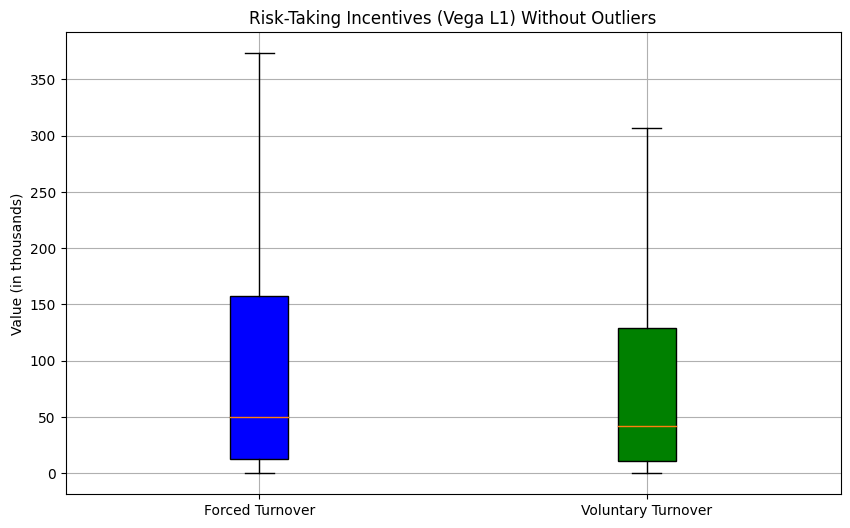

In [ ]:
data = [data_forced['vega_l1'], data_voluntary['vega_l1']]
labels = ['Forced Turnover', 'Voluntary Turnover']

# Create box plots without outliers
plt.figure(figsize=(10, 6))
box = plt.boxplot(data, labels=labels, patch_artist=True, showfliers=False)  # No outliers

# Adding colors
colors = ['blue', 'green']
for patch, color in zip(box['boxes'], colors):
    patch.set_facecolor(color)

# Adding titles and labels
plt.title('Risk-Taking Incentives (Vega L1) Without Outliers')
plt.ylabel('Value (in thousands)')
plt.grid(True)

# Show the plot
plt.show()



## Correlation Heatmap

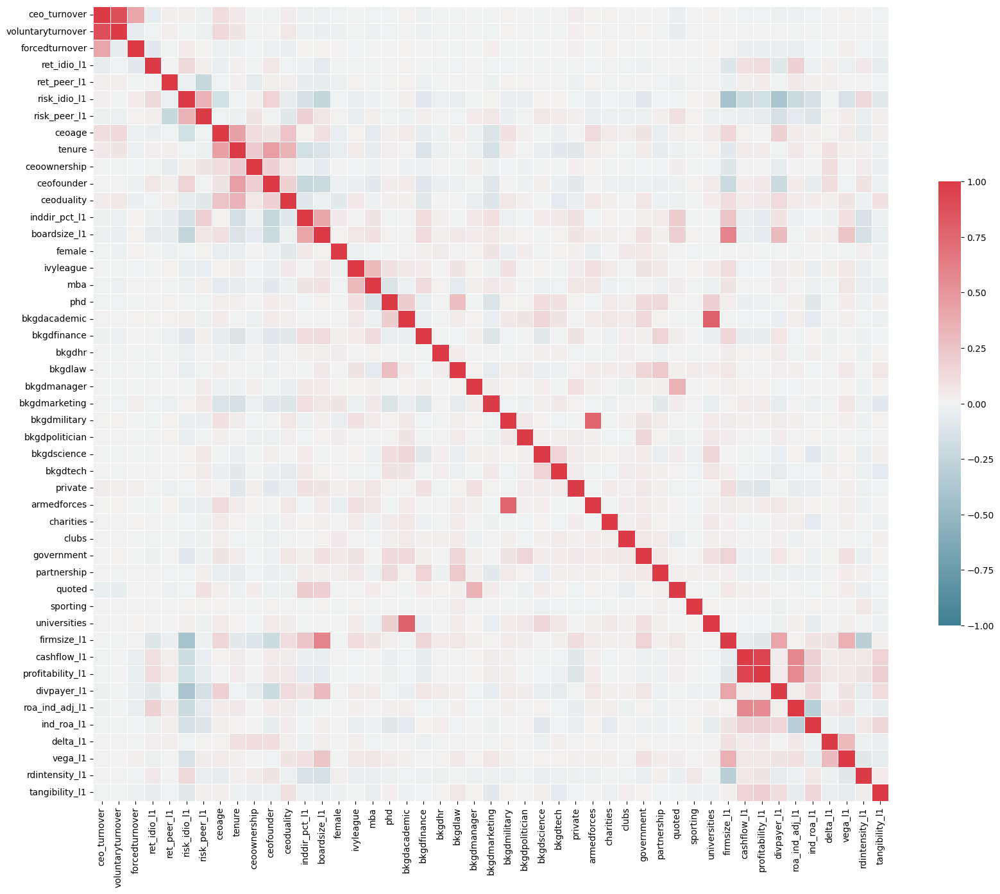

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Compute the correlation matrix
corr = data_all.corr()

# Set the variables in the order that you want them to appear on the heatmap
variables = ['ceo_turnover', 'voluntaryturnover', 'forcedturnover', 'ret_idio_l1', 'ret_peer_l1',
             'risk_idio_l1', 'risk_peer_l1','ceoage', 'tenure', 'ceoownership', 'ceofounder', 'ceoduality','inddir_pct_l1',
             'boardsize_l1','female','ivyleague','mba','phd','bkgdacademic','bkgdfinance','bkgdhr','bkgdlaw','bkgdmanager',
             'bkgdmarketing','bkgdmilitary','bkgdpolitician','bkgdscience','bkgdtech','private','armedforces','charities',
             'clubs','government','partnership','quoted','sporting','universities','firmsize_l1','cashflow_l1',
             'profitability_l1','divpayer_l1','roa_ind_adj_l1','ind_roa_l1','delta_l1','vega_l1','rdintensity_l1','tangibility_l1']

# Reorder the correlation matrix using the variables that you defined
corr_reordered = corr.loc[variables, variables]

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(20, 18))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr_reordered, cmap=cmap, center=0, square=True, linewidths=.5, cbar_kws={"shrink": .5}, fmt=".2f", vmin=-1, vmax=1)

plt.show()


# Defining ID & Target, dropping columns

In [ ]:
# Define the ID column and the target column
id = 'index'
target = 'forcedturnover'

# ???????????????????????????????????????????????????????????????????????????????????????
# student to add more: decide which variables to drop for predictive models
# ???????????????????????????????????????????????????????????????????????????????????????
# We are dropping columns which would not aid our models, such as:
# gvkey: uniquely identifies
#fyear:
# ceo turnover and voluntary turnover
cols_to_drop = ['gvkey', 'fyear', 'ceo_turnover', 'voluntaryturnover' ] #student to fill
data  = data_all.drop(columns=cols_to_drop)

# Splitting data into Train, Development and Test

In [ ]:
###################################################
## split data to train, dev and test along timeline
###################################################

# train, dev for LightGBM and RUSBoost
train = data_all[data_all['fyear']<=2008]
dev = data_all[ (data_all['fyear']>2008) & (data_all['fyear']<=2012)]
test = data_all[data_all['fyear']>2012]

# drop columns not needed for predictive models
df_list = [train, dev, test]
for df in df_list:
    df.drop(cols_to_drop, axis=1, inplace=True)

# targets
y = data[target]
y_train = train[target]
y_dev = dev[target]
y_test = test[target]

#features
X = data.drop(columns=target)
X_train = train.drop(columns=target)
X_dev = dev.drop(columns=target)
X_test = test.drop(columns=target)

<ipython-input-33-4a18af8c0c7f>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(cols_to_drop, axis=1, inplace=True)
<ipython-input-33-4a18af8c0c7f>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(cols_to_drop, axis=1, inplace=True)
<ipython-input-33-4a18af8c0c7f>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(cols_to_drop, axis=1, inplace=True)


# Preparation for Sanity Check with Jenter & Kanaan

In [ ]:
#########################################
## estimate a full-sample logit model for comparison with Jenter & Kanaan
#########################################
# Fit the model using statsmodels
X = sm.add_constant(X)
model = sm.Logit(y, X)
results = model.fit()

# Print the summary results
print(results.summary())

Optimization terminated successfully.
         Current function value: 0.123321
         Iterations 10
                           Logit Regression Results                           
Dep. Variable:         forcedturnover   No. Observations:                31134
Model:                          Logit   Df Residuals:                    31089
Method:                           MLE   Df Model:                           44
Date:                Mon, 11 Mar 2024   Pseudo R-squ.:                 0.04736
Time:                        19:56:10   Log-Likelihood:                -3839.5
converged:                       True   LL-Null:                       -4030.4
Covariance Type:            nonrobust   LLR p-value:                 2.151e-55
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
const               -4.4237      0.776     -5.699      0.000      -5.945      -2.902
ret_idio_l

In [ ]:
summary_df = pd.DataFrame(results.summary().tables[1])

# Save the DataFrame to a CSV file
summary_df.to_csv("logit_model_summary.csv", index=False)

In [ ]:
data_new = data_all.copy()
# Create the dummy variable for CEO of Retirement Age, similar to Jenter & Kanaan
data_new['ceo_of_retirement_age'] = data_all['ceoage'].apply(lambda x: 1 if x > 63 and x < 66 else 0)


In [ ]:
# dropping an additional column of ceoage
cols_to_drop1 = ['gvkey', 'fyear', 'ceo_turnover', 'voluntaryturnover','ceoage' ]
data2  = data_new.drop(columns=cols_to_drop1)

X1 = data2.drop(columns=target)
y1 = data2[target]

In [ ]:
#########################################
# full-sample logit model with CEO of retirement age as binary
# This was done to check if age would become a significant coefficient if turned into a binary variable.
#########################################
# Fit the model using statsmodels
X1 = sm.add_constant(X1)
model1 = sm.Logit(y1, X1)
results1 = model1.fit()

# Print the summary results
print(results1.summary())

Optimization terminated successfully.
         Current function value: 0.123309
         Iterations 10
                           Logit Regression Results                           
Dep. Variable:         forcedturnover   No. Observations:                31134
Model:                          Logit   Df Residuals:                    31089
Method:                           MLE   Df Model:                           44
Date:                Mon, 11 Mar 2024   Pseudo R-squ.:                 0.04746
Time:                        19:56:11   Log-Likelihood:                -3839.1
converged:                       True   LL-Null:                       -4030.4
Covariance Type:            nonrobust   LLR p-value:                 1.526e-55
                            coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                    -4.5739      0.734     -6.232      0.000      -6.012      -3

We could not find any significance with a categorical age variable similar to Jenter & Kannaan

In [ ]:
summary_df2 = pd.DataFrame(results1.summary().tables[1])

# Save the DataFrame to a CSV file
summary_df2.to_csv("logit_model_summary2.csv", index=False)

# Logistic Regression

In [ ]:

# Initialize lists outside the loop
tune_C = []
tune_rocs = []

for c in [0.01, 0.1, 0.15, 0.21, 0.3]:
    logit = LogisticRegression(penalty='l1', max_iter=int(1e6), solver='liblinear', C=c, random_state=0, class_weight="balanced")

    # Fit the model on the training data
    logit.fit(X_train, y_train)

    # Make predictions on the dev dataset
    proba = logit.predict_proba(X_dev)

    # Evaluation: ROC AUC
    fpr, tpr, thresholds = metrics.roc_curve(y_dev, proba[:, 1])
    roc_auc = metrics.auc(fpr, tpr)
    print(f"For C equals to {c}, roc is {roc_auc}")

    # Store the results
    tune_C.append(c)
    tune_rocs.append(roc_auc)

# Find the best parameter value
best_idx = np.argmax(tune_rocs)
best_C = tune_C[best_idx]
best_roc = tune_rocs[best_idx]

print(f"Best C is {best_C} with a ROC AUC of {best_roc}")

# Re-fit the model on the entire training data using the best parameter value
best_logit = LogisticRegression(penalty='l1', max_iter=int(1e6), solver='liblinear', C=best_C, random_state=0, class_weight="balanced")
best_logit.fit(X_train, y_train)

# Evaluation on dev data
proba = best_logit.predict_proba(X_dev)
fpr, tpr, thresholds = metrics.roc_curve(y_dev, proba[:,1])
roc_auc = metrics.auc(fpr, tpr)
print("ROC_AUC score on dev data using the best C is: ", roc_auc)


For C equals to 0.01, roc is 0.6219635597929402
For C equals to 0.1, roc is 0.6403100049717778
For C equals to 0.15, roc is 0.6398409031088235
For C equals to 0.21, roc is 0.6377492469218845
For C equals to 0.3, roc is 0.6357149124089726
Best C is 0.1 with a ROC AUC of 0.6403100049717778
ROC_AUC score on dev data using the best C is:  0.6403100049717778


# LightGBM

In [ ]:
# Initialize the logistic regression model with the best C value
final_logit = LogisticRegression(penalty='l1', max_iter=int(1e6), solver='liblinear', C=best_C, random_state=0, class_weight="balanced")

# Fit the final model on the combined dataset
final_logit.fit(X_combined, y_combined)

LogisticRegression(C=0.1, class_weight='balanced', max_iter=1000000,
                   penalty='l1', random_state=0, solver='liblinear')

The best parameters for LASSO model were c= 0.3, class_weight='balanced', max_iter=1000000,
                   penalty='l1', random_state=0, solver='liblinear'
 Smaller values specify stronger regularization. By setting C to 0.1, the model applies moderate regularization to the coefficients, which can help prevent overfitting by penalizing larger-valued coefficients.
 class_weight ('balanced'): This parameter is used to adjust weights inversely proportional to class frequencies in the input data. 'Balanced' will use the values of y to automatically adjust weights inversely proportional to class frequencies, which can be useful for dealing with imbalanced datasets
 solver ('liblinear'): This specifies the algorithm used in the optimization problem. 'liblinear' is a good choice for small datasets and binary classification, and it is one of the few solvers that supports 'l1' penalization.

In [ ]:
import lightgbm as lgb
from sklearn import metrics
import numpy as np


# Initialize lists to store results
rocs_lgbm = []
lgbm_models = []
l_rate = []
n_leaves = []
max_depths = []
subsamples = []

# Define hyperparameter ranges
learning_rates = [0.001, 0.01, 0.03, 0.05, 0.1, 0.15, 0.3]
num_leaves = [15, 20, 31, 63, 70]
max_depth_range = [3, 5, 7, 10]
subsample_range = [0.6, 0.8, 1.0] # Fraction of samples to use

# Fixed parameters
params = {
    'boosting_type': 'gbdt', # type of alogrithm to run
    'objective': 'binary', # binary classification problem
    'is_unbalance': 'true', # to match for the imbalance dataset
    'metric': 'auc', # metric to evaluate is ROC AUC
    'random_state': 0, # to replicate results
}

for rate in learning_rates: # controls the step size at each iteration
    params['learning_rate'] = rate
    for l in num_leaves: # to control complexity of the model
        params['num_leaves'] = l
        for max_depth in max_depth_range: # limits the maximum tree depth
            params['max_depth'] = max_depth
            for subsample in subsample_range: #subsample ratio of the training instance
                params['subsample'] = subsample

                # Initialize and train model
                gbm = lgb.LGBMClassifier(n_estimators=500, **params) #number of boosting iterations 500
                gbm.fit(X_train, y_train, eval_set=[(X_dev, y_dev)],
                        callbacks=[lgb.callback.early_stopping(10, verbose=5), #regularisation to avoid overfitting
                                   lgb.callback.log_evaluation(50)]) # logs the evaluation results of the model

                # Make predictions
                y_dev_pred_proba_lgbm = gbm.predict_proba(X_dev, num_iteration=gbm.best_iteration_)

                # Evaluation
                fpr, tpr, thresholds = metrics.roc_curve(y_dev, y_dev_pred_proba_lgbm[:, 1])
                roc_auc_lgbm = metrics.auc(fpr, tpr)

                # Store results
                rocs_lgbm.append(roc_auc_lgbm)
                lgbm_models.append(gbm)
                l_rate.append(rate)
                n_leaves.append(l)
                max_depths.append(max_depth)
                subsamples.append(subsample)

# Identify the best model
best_index_lgbm = np.argmax(rocs_lgbm)
best_auc_lgbm = rocs_lgbm[best_index_lgbm]
best_model_lgbm = lgbm_models[best_index_lgbm]

print(f"Best AUC: {best_auc_lgbm}")
print(f"Best Learning Rate: {l_rate[best_index_lgbm]}")
print(f"Best Num Leaves: {n_leaves[best_index_lgbm]}")
print(f"Best Max Depth: {max_depths[best_index_lgbm]}")
print(f"Best Subsample: {subsamples[best_index_lgbm]}")

Streaming output truncated to the last 5000 lines.
[LightGBM] [Info] Start training from score -3.564167
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[50]	valid_0's auc: 0.64389
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[53]	valid_0's auc: 0.645692
[LightGBM] [Info] Number of positive: 529, number of negative: 18679
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007016 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true

These are the best parameters of the LightGBM classifier.
is_unbalance='true', learning_rate=0.03, max_depth=10,
               metric='auc', n_estimators=500, num_leaves=15,
               objective='binary', random_state=0, subsample=0.6)

# RUSBoost

In [ ]:
import pickle
from sklearn import metrics
from imblearn.ensemble import RUSBoostClassifier

# Assuming best_model_lgbm and other variables (X_train, y_train, etc.) are defined correctly

# Fixed hyperparameters for RUSBoostClassifier
params2 = {'sampling_strategy': 'all', 'random_state': 0}

# sampling strategy:sampling technique should resample the dataset. By setting it to 'all', you're indicating that the sampling method should attempt to balance all classes to the same number of samples as the majority class.

# Assuming best_model_lgbm is defined and a valid estimator
# Define the RUSBoost model
rusb = RUSBoostClassifier(base_estimator=best_model_lgbm, **params2)

learning_rates = [0.01, 0.03, 0.05, 0.1, 0.15] # controls the step size at each iteration
num_estimators = [1, 2, 3, 4, 5, 7, 10, 12, 50, 55] #number of boosting iterations 500
# Initialize lists to store the results
tune_numests, tune_lrs, tune_rocs = [], [], []

for lr in learning_rates:
    rusb.learning_rate = lr
    for n_estimators in num_estimators:
        rusb.n_estimators = n_estimators
        # Fit the model
        rusb.fit(X_train, y_train.ravel())  # Assuming y_train is a pandas Series or similar

        # Predictions
        proba = rusb.predict_proba(X_dev)

        # Evaluation for parameter tuning
        fpr, tpr, thresholds = metrics.roc_curve(y_dev, proba[:, 1])
        roc_auc = metrics.auc(fpr, tpr)

        # Save results
        tune_numests.append(n_estimators)
        tune_lrs.append(lr)
        tune_rocs.append(roc_auc)

best_idx = np.argmax(tune_rocs)
b_numests, b_lr = tune_numests[best_idx], tune_lrs[best_idx]

# Re-fit the model on the entire training dataset using the best parameter values
rusb.learning_rate = b_lr
rusb.n_estimators = b_numests
rusb.fit(X_train, y_train.ravel())

# Make predictions on dev data
proba = rusb.predict_proba(X_dev)

# Evaluation on dev data
fpr, tpr, thresholds = metrics.roc_curve(y_dev, proba[:, 1])
roc_auc_dev_rusb = metrics.auc(fpr, tpr)

print(f"Best number of estimators: {b_numests}")
print(f"Best learning rate: {b_lr}")
print(f"Best ROC AUC: {tune_rocs[best_idx]}")
print("ROC AUC score on dev data for RUSB is: ", roc_auc_dev_rusb)

# Save the model
with open('rusb.pkl', 'wb') as f:
    pickle.dump(rusb, f)


[LightGBM] [Info] Number of positive: 529, number of negative: 529
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001318 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3903
[LightGBM] [Info] Number of data points in the train set: 1058, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive

/usr/local/lib/python3.10/dist-packages/imblearn/ensemble/_weight_boosting.py:267: FutureWarning: `base_estimator` was renamed to `estimator` in version 0.10 and will be removed in 0.12.
  warnings.warn(


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/usr/local/lib/python3.10/dist-packages/imblearn/ensemble/_weight_boosting.py:267: FutureWarning: `base_estimator` was renamed to `estimator` in version 0.10 and will be removed in 0.12.
  warnings.warn(


[LightGBM] [Info] Number of positive: 529, number of negative: 529
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000474 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3903
[LightGBM] [Info] Number of data points in the train set: 1058, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive

/usr/local/lib/python3.10/dist-packages/imblearn/ensemble/_weight_boosting.py:267: FutureWarning: `base_estimator` was renamed to `estimator` in version 0.10 and will be removed in 0.12.
  warnings.warn(


[LightGBM] [Info] Number of positive: 529, number of negative: 529
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000402 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3903
[LightGBM] [Info] Number of data points in the train set: 1058, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive

/usr/local/lib/python3.10/dist-packages/imblearn/ensemble/_weight_boosting.py:267: FutureWarning: `base_estimator` was renamed to `estimator` in version 0.10 and will be removed in 0.12.
  warnings.warn(


[LightGBM] [Info] Number of positive: 529, number of negative: 529
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000433 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3903
[LightGBM] [Info] Number of data points in the train set: 1058, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive

/usr/local/lib/python3.10/dist-packages/imblearn/ensemble/_weight_boosting.py:267: FutureWarning: `base_estimator` was renamed to `estimator` in version 0.10 and will be removed in 0.12.
  warnings.warn(


[LightGBM] [Info] Number of positive: 529, number of negative: 529
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000491 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3903
[LightGBM] [Info] Number of data points in the train set: 1058, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive

/usr/local/lib/python3.10/dist-packages/imblearn/ensemble/_weight_boosting.py:267: FutureWarning: `base_estimator` was renamed to `estimator` in version 0.10 and will be removed in 0.12.
  warnings.warn(


[LightGBM] [Info] Number of positive: 529, number of negative: 529
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000452 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3903
[LightGBM] [Info] Number of data points in the train set: 1058, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive

/usr/local/lib/python3.10/dist-packages/imblearn/ensemble/_weight_boosting.py:267: FutureWarning: `base_estimator` was renamed to `estimator` in version 0.10 and will be removed in 0.12.
  warnings.warn(


Streaming output truncated to the last 5000 lines.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posit

/usr/local/lib/python3.10/dist-packages/imblearn/ensemble/_weight_boosting.py:267: FutureWarning: `base_estimator` was renamed to `estimator` in version 0.10 and will be removed in 0.12.
  warnings.warn(


Streaming output truncated to the last 5000 lines.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posit

/usr/local/lib/python3.10/dist-packages/imblearn/ensemble/_weight_boosting.py:267: FutureWarning: `base_estimator` was renamed to `estimator` in version 0.10 and will be removed in 0.12.
  warnings.warn(


Streaming output truncated to the last 5000 lines.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posit

/usr/local/lib/python3.10/dist-packages/imblearn/ensemble/_weight_boosting.py:267: FutureWarning: `base_estimator` was renamed to `estimator` in version 0.10 and will be removed in 0.12.
  warnings.warn(


Streaming output truncated to the last 5000 lines.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posit

/usr/local/lib/python3.10/dist-packages/imblearn/ensemble/_weight_boosting.py:267: FutureWarning: `base_estimator` was renamed to `estimator` in version 0.10 and will be removed in 0.12.
  warnings.warn(


[LightGBM] [Info] Number of positive: 529, number of negative: 529
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000396 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3903
[LightGBM] [Info] Number of data points in the train set: 1058, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive

/usr/local/lib/python3.10/dist-packages/imblearn/ensemble/_weight_boosting.py:267: FutureWarning: `base_estimator` was renamed to `estimator` in version 0.10 and will be removed in 0.12.
  warnings.warn(


[LightGBM] [Info] Number of positive: 529, number of negative: 529
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000806 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3903
[LightGBM] [Info] Number of data points in the train set: 1058, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wi

/usr/local/lib/python3.10/dist-packages/imblearn/ensemble/_weight_boosting.py:267: FutureWarning: `base_estimator` was renamed to `estimator` in version 0.10 and will be removed in 0.12.
  warnings.warn(


[LightGBM] [Info] Number of positive: 529, number of negative: 529
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000436 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3903
[LightGBM] [Info] Number of data points in the train set: 1058, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive

/usr/local/lib/python3.10/dist-packages/imblearn/ensemble/_weight_boosting.py:267: FutureWarning: `base_estimator` was renamed to `estimator` in version 0.10 and will be removed in 0.12.
  warnings.warn(


[LightGBM] [Info] Number of positive: 529, number of negative: 529
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000467 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3903
[LightGBM] [Info] Number of data points in the train set: 1058, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive

/usr/local/lib/python3.10/dist-packages/imblearn/ensemble/_weight_boosting.py:267: FutureWarning: `base_estimator` was renamed to `estimator` in version 0.10 and will be removed in 0.12.
  warnings.warn(


[LightGBM] [Info] Number of positive: 529, number of negative: 529
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000796 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3903
[LightGBM] [Info] Number of data points in the train set: 1058, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wi

/usr/local/lib/python3.10/dist-packages/imblearn/ensemble/_weight_boosting.py:267: FutureWarning: `base_estimator` was renamed to `estimator` in version 0.10 and will be removed in 0.12.
  warnings.warn(


[LightGBM] [Info] Number of positive: 529, number of negative: 529
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000555 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3903
[LightGBM] [Info] Number of data points in the train set: 1058, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive

/usr/local/lib/python3.10/dist-packages/imblearn/ensemble/_weight_boosting.py:267: FutureWarning: `base_estimator` was renamed to `estimator` in version 0.10 and will be removed in 0.12.
  warnings.warn(


Streaming output truncated to the last 5000 lines.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posit

/usr/local/lib/python3.10/dist-packages/imblearn/ensemble/_weight_boosting.py:267: FutureWarning: `base_estimator` was renamed to `estimator` in version 0.10 and will be removed in 0.12.
  warnings.warn(


Streaming output truncated to the last 5000 lines.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posit

/usr/local/lib/python3.10/dist-packages/imblearn/ensemble/_weight_boosting.py:267: FutureWarning: `base_estimator` was renamed to `estimator` in version 0.10 and will be removed in 0.12.
  warnings.warn(


Streaming output truncated to the last 5000 lines.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posit

/usr/local/lib/python3.10/dist-packages/imblearn/ensemble/_weight_boosting.py:267: FutureWarning: `base_estimator` was renamed to `estimator` in version 0.10 and will be removed in 0.12.
  warnings.warn(


Streaming output truncated to the last 5000 lines.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posit

/usr/local/lib/python3.10/dist-packages/imblearn/ensemble/_weight_boosting.py:267: FutureWarning: `base_estimator` was renamed to `estimator` in version 0.10 and will be removed in 0.12.
  warnings.warn(


[LightGBM] [Info] Number of positive: 529, number of negative: 529
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000446 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3903
[LightGBM] [Info] Number of data points in the train set: 1058, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive

/usr/local/lib/python3.10/dist-packages/imblearn/ensemble/_weight_boosting.py:267: FutureWarning: `base_estimator` was renamed to `estimator` in version 0.10 and will be removed in 0.12.
  warnings.warn(


[LightGBM] [Info] Number of positive: 529, number of negative: 529
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000439 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3903
[LightGBM] [Info] Number of data points in the train set: 1058, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive

/usr/local/lib/python3.10/dist-packages/imblearn/ensemble/_weight_boosting.py:267: FutureWarning: `base_estimator` was renamed to `estimator` in version 0.10 and will be removed in 0.12.
  warnings.warn(


[LightGBM] [Info] Number of positive: 529, number of negative: 529
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000624 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3903
[LightGBM] [Info] Number of data points in the train set: 1058, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wi

/usr/local/lib/python3.10/dist-packages/imblearn/ensemble/_weight_boosting.py:267: FutureWarning: `base_estimator` was renamed to `estimator` in version 0.10 and will be removed in 0.12.
  warnings.warn(


[LightGBM] [Info] Number of positive: 529, number of negative: 529
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000488 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3903
[LightGBM] [Info] Number of data points in the train set: 1058, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive

/usr/local/lib/python3.10/dist-packages/imblearn/ensemble/_weight_boosting.py:267: FutureWarning: `base_estimator` was renamed to `estimator` in version 0.10 and will be removed in 0.12.
  warnings.warn(


[LightGBM] [Info] Number of positive: 529, number of negative: 529
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000809 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3903
[LightGBM] [Info] Number of data points in the train set: 1058, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wi

/usr/local/lib/python3.10/dist-packages/imblearn/ensemble/_weight_boosting.py:267: FutureWarning: `base_estimator` was renamed to `estimator` in version 0.10 and will be removed in 0.12.
  warnings.warn(


[LightGBM] [Info] Number of positive: 529, number of negative: 529
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000447 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3903
[LightGBM] [Info] Number of data points in the train set: 1058, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive

/usr/local/lib/python3.10/dist-packages/imblearn/ensemble/_weight_boosting.py:267: FutureWarning: `base_estimator` was renamed to `estimator` in version 0.10 and will be removed in 0.12.
  warnings.warn(


Streaming output truncated to the last 5000 lines.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posit

/usr/local/lib/python3.10/dist-packages/imblearn/ensemble/_weight_boosting.py:267: FutureWarning: `base_estimator` was renamed to `estimator` in version 0.10 and will be removed in 0.12.
  warnings.warn(


Streaming output truncated to the last 5000 lines.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posit

/usr/local/lib/python3.10/dist-packages/imblearn/ensemble/_weight_boosting.py:267: FutureWarning: `base_estimator` was renamed to `estimator` in version 0.10 and will be removed in 0.12.
  warnings.warn(


Streaming output truncated to the last 5000 lines.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posit

/usr/local/lib/python3.10/dist-packages/imblearn/ensemble/_weight_boosting.py:267: FutureWarning: `base_estimator` was renamed to `estimator` in version 0.10 and will be removed in 0.12.
  warnings.warn(


Streaming output truncated to the last 5000 lines.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posit

/usr/local/lib/python3.10/dist-packages/imblearn/ensemble/_weight_boosting.py:267: FutureWarning: `base_estimator` was renamed to `estimator` in version 0.10 and will be removed in 0.12.
  warnings.warn(


[LightGBM] [Info] Number of positive: 529, number of negative: 529
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000430 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3903
[LightGBM] [Info] Number of data points in the train set: 1058, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive

/usr/local/lib/python3.10/dist-packages/imblearn/ensemble/_weight_boosting.py:267: FutureWarning: `base_estimator` was renamed to `estimator` in version 0.10 and will be removed in 0.12.
  warnings.warn(


[LightGBM] [Info] Number of positive: 529, number of negative: 529
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000484 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3903
[LightGBM] [Info] Number of data points in the train set: 1058, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive

/usr/local/lib/python3.10/dist-packages/imblearn/ensemble/_weight_boosting.py:267: FutureWarning: `base_estimator` was renamed to `estimator` in version 0.10 and will be removed in 0.12.
  warnings.warn(


[LightGBM] [Info] Number of positive: 529, number of negative: 529
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000456 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3903
[LightGBM] [Info] Number of data points in the train set: 1058, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive

/usr/local/lib/python3.10/dist-packages/imblearn/ensemble/_weight_boosting.py:267: FutureWarning: `base_estimator` was renamed to `estimator` in version 0.10 and will be removed in 0.12.
  warnings.warn(


[LightGBM] [Info] Number of positive: 529, number of negative: 529
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000601 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3903
[LightGBM] [Info] Number of data points in the train set: 1058, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wi

/usr/local/lib/python3.10/dist-packages/imblearn/ensemble/_weight_boosting.py:267: FutureWarning: `base_estimator` was renamed to `estimator` in version 0.10 and will be removed in 0.12.
  warnings.warn(


[LightGBM] [Info] Number of positive: 529, number of negative: 529
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000447 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3903
[LightGBM] [Info] Number of data points in the train set: 1058, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive

/usr/local/lib/python3.10/dist-packages/imblearn/ensemble/_weight_boosting.py:267: FutureWarning: `base_estimator` was renamed to `estimator` in version 0.10 and will be removed in 0.12.
  warnings.warn(


[LightGBM] [Info] Number of positive: 529, number of negative: 529
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000518 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3903
[LightGBM] [Info] Number of data points in the train set: 1058, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive

/usr/local/lib/python3.10/dist-packages/imblearn/ensemble/_weight_boosting.py:267: FutureWarning: `base_estimator` was renamed to `estimator` in version 0.10 and will be removed in 0.12.
  warnings.warn(


Streaming output truncated to the last 5000 lines.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posit

/usr/local/lib/python3.10/dist-packages/imblearn/ensemble/_weight_boosting.py:267: FutureWarning: `base_estimator` was renamed to `estimator` in version 0.10 and will be removed in 0.12.
  warnings.warn(


Streaming output truncated to the last 5000 lines.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posit

/usr/local/lib/python3.10/dist-packages/imblearn/ensemble/_weight_boosting.py:267: FutureWarning: `base_estimator` was renamed to `estimator` in version 0.10 and will be removed in 0.12.
  warnings.warn(


Streaming output truncated to the last 5000 lines.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posit

/usr/local/lib/python3.10/dist-packages/imblearn/ensemble/_weight_boosting.py:267: FutureWarning: `base_estimator` was renamed to `estimator` in version 0.10 and will be removed in 0.12.
  warnings.warn(


Streaming output truncated to the last 5000 lines.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posit

/usr/local/lib/python3.10/dist-packages/imblearn/ensemble/_weight_boosting.py:267: FutureWarning: `base_estimator` was renamed to `estimator` in version 0.10 and will be removed in 0.12.
  warnings.warn(


[LightGBM] [Info] Number of positive: 529, number of negative: 529
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001000 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3903
[LightGBM] [Info] Number of data points in the train set: 1058, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wi

/usr/local/lib/python3.10/dist-packages/imblearn/ensemble/_weight_boosting.py:267: FutureWarning: `base_estimator` was renamed to `estimator` in version 0.10 and will be removed in 0.12.
  warnings.warn(


[LightGBM] [Info] Number of positive: 529, number of negative: 529
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000467 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3903
[LightGBM] [Info] Number of data points in the train set: 1058, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive

/usr/local/lib/python3.10/dist-packages/imblearn/ensemble/_weight_boosting.py:267: FutureWarning: `base_estimator` was renamed to `estimator` in version 0.10 and will be removed in 0.12.
  warnings.warn(


[LightGBM] [Info] Number of positive: 529, number of negative: 529
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000446 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3903
[LightGBM] [Info] Number of data points in the train set: 1058, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive

/usr/local/lib/python3.10/dist-packages/imblearn/ensemble/_weight_boosting.py:267: FutureWarning: `base_estimator` was renamed to `estimator` in version 0.10 and will be removed in 0.12.
  warnings.warn(


[LightGBM] [Info] Number of positive: 529, number of negative: 529
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000458 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3903
[LightGBM] [Info] Number of data points in the train set: 1058, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive

/usr/local/lib/python3.10/dist-packages/imblearn/ensemble/_weight_boosting.py:267: FutureWarning: `base_estimator` was renamed to `estimator` in version 0.10 and will be removed in 0.12.
  warnings.warn(


[LightGBM] [Info] Number of positive: 529, number of negative: 529
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000820 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3903
[LightGBM] [Info] Number of data points in the train set: 1058, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wi

/usr/local/lib/python3.10/dist-packages/imblearn/ensemble/_weight_boosting.py:267: FutureWarning: `base_estimator` was renamed to `estimator` in version 0.10 and will be removed in 0.12.
  warnings.warn(


[LightGBM] [Info] Number of positive: 529, number of negative: 529
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000435 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3903
[LightGBM] [Info] Number of data points in the train set: 1058, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive

/usr/local/lib/python3.10/dist-packages/imblearn/ensemble/_weight_boosting.py:267: FutureWarning: `base_estimator` was renamed to `estimator` in version 0.10 and will be removed in 0.12.
  warnings.warn(


Streaming output truncated to the last 5000 lines.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posit

/usr/local/lib/python3.10/dist-packages/imblearn/ensemble/_weight_boosting.py:267: FutureWarning: `base_estimator` was renamed to `estimator` in version 0.10 and will be removed in 0.12.
  warnings.warn(


Streaming output truncated to the last 5000 lines.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posit

/usr/local/lib/python3.10/dist-packages/imblearn/ensemble/_weight_boosting.py:267: FutureWarning: `base_estimator` was renamed to `estimator` in version 0.10 and will be removed in 0.12.
  warnings.warn(


Streaming output truncated to the last 5000 lines.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posit

/usr/local/lib/python3.10/dist-packages/imblearn/ensemble/_weight_boosting.py:267: FutureWarning: `base_estimator` was renamed to `estimator` in version 0.10 and will be removed in 0.12.
  warnings.warn(


Streaming output truncated to the last 5000 lines.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with posit

/usr/local/lib/python3.10/dist-packages/imblearn/ensemble/_weight_boosting.py:267: FutureWarning: `base_estimator` was renamed to `estimator` in version 0.10 and will be removed in 0.12.
  warnings.warn(


[LightGBM] [Info] Number of positive: 529, number of negative: 529
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000847 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3903
[LightGBM] [Info] Number of data points in the train set: 1058, number of used features: 38
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wi

# Running Trained Models on Test Data

In [ ]:
#########################################################
## compare model performance in test data
#########################################################

## set up a dictionary for models
ml_models = {
    "Logit": logit,
    "LightGBM": best_model_lgbm,
    "RUSBoost": rusb}

## Predictions
for model_name , model in ml_models . items ():
    # predict probatilities and classes
    proba = model.predict_proba(X_test)
    predictions = model.predict(X_test)

    fpr, tpr, thresholds = metrics.roc_curve(y_test, proba[:,1])
    roc_auc = metrics.auc(fpr, tpr)
    print(model_name, "ROC AUC score in test data using f'{model}'= ", roc_auc)

    # retrive data
    fpr, tpr, thresholds = metrics.roc_curve(y_test, proba[:,1])

    # draw and save confusion matrix

    # confusion matirx
    cm = confusion_matrix(y_test, predictions, labels=rusb.classes_, normalize=None)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=rusb.classes_)
    disp.plot()

    # save the plot to a file
    plt.savefig('confusion_matrix_{}.pdf'.format(model_name))

    # clear the plot for the next iteration
    plt.clf()

    # draw receiver operating characteristic curve (ROC curve)
    displayRocCurve = metrics.RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc, estimator_name = f'{model_name}')
    displayRocCurve.plot()

    # save the plot to a file
    plt.savefig('roc_curve_{}.pdf'.format(model_name))

    # clear the plot for the next iteration
    plt.clf()

Logit ROC AUC score in test data using f'{model}'=  0.6436559162537161
LightGBM ROC AUC score in test data using f'{model}'=  0.6412713965879394
RUSBoost ROC AUC score in test data using f'{model}'=  0.6699507389162562


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

In [ ]:
aucs_all = []


# iterate the dictionary: for each iteration, get key (model name) and value(model)
for model_name , model in ml_models.items():
    aucs_each_split = []
    # predict probatilities and classes
    for x,y in {'train': (X_train,y_train), 'dev': (X_dev,y_dev), 'test': (X_test,y_test)}.values():
      proba_test = model.predict_proba(x)
      fpr, tpr, thresholds = metrics.roc_curve(y, proba_test[:,1]) #we used ROC_AUC as our main metric to compare the models
      roc_auc = metrics.auc(fpr, tpr)
      aucs_each_split.append(roc_auc)

    aucs_all.append(aucs_each_split)

df_aucs = pd.DataFrame(data=aucs_all, columns=['Train', 'Dev', 'Test'], index=ml_models.keys())
df_aucs

,Train,Dev,Test
Logit,0.709813,0.670502,0.643656
LightGBM,0.984939,0.989817,0.641271
RUSBoost,0.853894,0.866267,0.669951


As you can see, LightGBM performs extremely well on train and development data. Since we combined the train and development sets, the data is overfitting. The RUSBoost in comparison is consistent.

In [ ]:
import plotly.graph_objects as go
from sklearn import metrics

# Assuming ml_models, X_test, and y_test are defined
# Prepare the figure
fig = go.Figure()

# Generate ROC curve for each model and add to the figure
for model_name, model in ml_models.items():
    # Predict probabilities
    proba = model.predict_proba(X_test)[:,1]
    fpr, tpr, thresholds = metrics.roc_curve(y_test, proba)
    roc_auc = metrics.auc(fpr, tpr)

    # Add trace for the ROC curve
    fig.add_trace(go.Scatter(x=fpr, y=tpr, mode='lines', name=f'{model_name} (AUC = {roc_auc:.2f})'))

# Adjust the layout, ensuring there's enough space for the legend
fig.update_layout(
    title='ROC Curves Comparison',
    xaxis_title='False Positive Rate',
    yaxis_title='True Positive Rate',
    yaxis=dict(scaleanchor="x", scaleratio=1),
    xaxis=dict(constrain='domain'),
    width=800, height=800,
    # Set the legend position
    legend=dict(x=0, y=1, xanchor='left', yanchor='auto'),
    # Optionally, adjust margins to ensure the legend is within the viewable area
    margin=dict(l=100, r=20, t=100, b=70),
    legend_title=dict(text='Models'),
    # Make the background slightly transparent for visibility
    legend_bgcolor="rgba(255, 255, 255, 0.6)"
)

# Show figure
fig.show()


## Classification Report

This is the second metric we will use to compare the 3 models. This classification report will generate F1-score, precision, recall and accuracy.

In [ ]:

from sklearn.metrics import classification_report

# Dictionary to hold classification reports
classification_reports_dfs = {}

# Iterate over models and datasets
for model_name, model in ml_models.items():
    for split_name, (x, y) in {'train': (X_train, y_train), 'dev': (X_dev, y_dev), 'test': (X_test, y_test)}.items():
        y_pred = model.predict(x)
        report = classification_report(y, y_pred, output_dict=True)

        # Convert the report into a DataFrame
        report_df = pd.DataFrame(report).transpose()

        # Create a multi-index using model name and dataset name
        report_df.index = pd.MultiIndex.from_product([[model_name], [split_name], report_df.index],
                                                     names=['Model', 'Dataset', 'Class'])
        classification_reports_dfs[(model_name, split_name)] = report_df

# Concatenate all DataFrames
all_reports_df = pd.concat(classification_reports_dfs.values())

# Display the concatenated DataFrame
print(all_reports_df)


                               precision    recall  f1-score       support
Model    Dataset Class                                                    
Logit    train   0.0            0.984516  0.687617  0.809708  18679.000000
                 1.0            0.053067  0.618147  0.097743    529.000000
                 accuracy       0.685704  0.685704  0.685704      0.685704
                 macro avg      0.518792  0.652882  0.453726  19208.000000
                 weighted avg   0.958864  0.685704  0.790100  19208.000000
         dev     0.0            0.984593  0.602539  0.747582   5515.000000
                 1.0            0.044880  0.664516  0.084082    155.000000
                 accuracy       0.604233  0.604233  0.604233      0.604233
                 macro avg      0.514736  0.633527  0.415832   5670.000000
                 weighted avg   0.958904  0.604233  0.729444   5670.000000
         test    0.0            0.978135  0.642987  0.775917   6053.000000
                 1.0     

# Feature Importance

## Feature Importance for RUSBoost

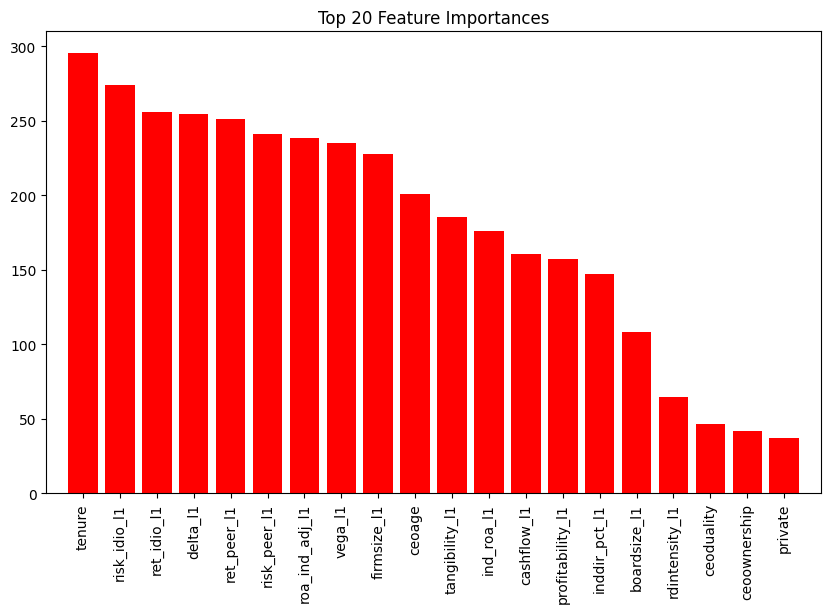

In [ ]:
importances = rusb.feature_importances_
# For visualization, get the feature names
feature_names = X_test.columns

# Sorting the feature importances in descending order
indices = np.argsort(importances)[::-1]

# Selecting the top 20 features
top_indices = indices[:20]

# Plotting the feature importances of the top 20 features
plt.figure(figsize=(10, 6))
plt.title("Top 20 Feature Importances")
plt.bar(range(len(top_indices)), importances[top_indices],
        color="r", align="center")
plt.xticks(range(len(top_indices)), feature_names[top_indices], rotation=90)
plt.xlim([-1, len(top_indices)])
plt.show()


In [ ]:
importances

array([256.33333333, 251.33333333, 274.33333333, 241.33333333,
       200.66666667, 295.33333333,  42.        ,   5.66666667,
        46.66666667, 147.        , 108.        ,   0.        ,
        23.33333333,  11.33333333,   0.        ,   0.        ,
        11.33333333,   0.        ,   0.        ,   0.        ,
        18.        ,   0.        ,   0.        ,  30.        ,
         0.        ,  37.        ,   0.        ,   0.        ,
         0.        ,   0.        ,   0.        ,   0.        ,
         0.        ,   0.        , 227.66666667, 160.66666667,
       157.66666667,  31.66666667, 238.33333333, 176.        ,
       254.33333333, 235.33333333,  64.66666667, 185.66666667])

RUSBoost does not have SHAP values, hence we've used feature importance. This bar chart above highlights 20 more important features.

In [ ]:
import plotly.express as px

importances = rusb.feature_importances_
# For visualization, get the feature names
feature_names = X_test.columns

# Sorting the feature importances in descending order
indices = np.argsort(importances)[::-1]

# Selecting the top 20 features
top_indices = indices[:20]
top_features = feature_names[top_indices]
top_importances = importances[top_indices]

# Creating a DataFrame for Plotly
df = pd.DataFrame({
    'Feature': top_features,
    'Importance': top_importances
})

# Plotting the feature importances of the top 20 features using Plotly
fig = px.bar(df, x='Feature', y='Importance', title='Top 20 Feature Importances')
fig.update_layout(xaxis_title='Feature', yaxis_title='Importance', xaxis={'categoryorder':'total descending'})
fig.show()


The RUSBoost model does not have SHAP values enabled, hence we follow this.

## SHAP Value for LightGBM

In [ ]:
!pip install shap

import shap

explainer = shap.TreeExplainer(final_gbm)
shap_values = explainer(X_test)
shap.plots.bar(shap_values[:,:,1])

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 538.2/538.2 kB 6.0 MB/s eta 0:00:00


IndexError: too many indices for array

Index(['gvkey', 'fyear', 'ceo_turnover', 'forcedturnover', 'voluntaryturnover',
       'ret_idio_l1', 'ret_peer_l1', 'risk_idio_l1', 'risk_peer_l1', 'ceoage',
       'tenure', 'ceoownership', 'ceofounder', 'ceoduality', 'inddir_pct_l1',
       'boardsize_l1', 'female', 'ivyleague', 'mba', 'phd', 'bkgdacademic',
       'bkgdfinance', 'bkgdhr', 'bkgdlaw', 'bkgdmanager', 'bkgdmarketing',
       'bkgdmilitary', 'bkgdpolitician', 'bkgdscience', 'bkgdtech', 'private',
       'armedforces', 'charities', 'clubs', 'government', 'partnership',
       'quoted', 'sporting', 'universities', 'firmsize_l1', 'cashflow_l1',
       'profitability_l1', 'divpayer_l1', 'roa_ind_adj_l1', 'ind_roa_l1',
       'delta_l1', 'vega_l1', 'rdintensity_l1', 'tangibility_l1'],
      dtype='object')
               gvkey        fyear  ceo_turnover  forcedturnover  \
count    2130.000000  2130.000000   2130.000000     2130.000000   
mean    47445.568075  2018.491549      0.178404        0.047887   
std     59938.268313 

<Figure size 640x480 with 0 Axes>

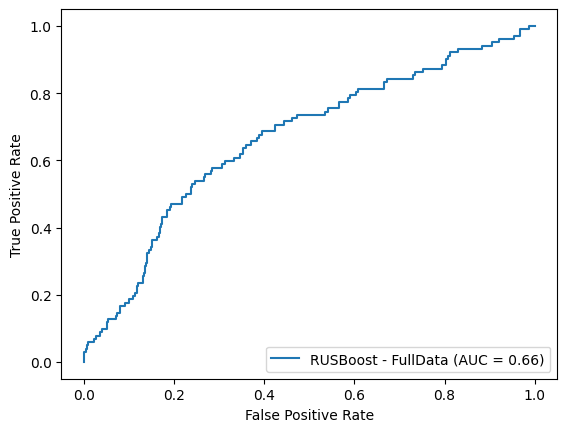

In [ ]:
complete_data = pd.read_stata("/content/OOS_data_after_submission.dta", index_col="index")
complete_data = complete_data.dropna()
print(complete_data.columns)
print(complete_data.describe())
complete_data.head()

# targets
y_complete = complete_data[target]

#features
X_complete = complete_data.drop(columns=["gvkey", "fyear", "ceo_turnover", "voluntaryturnover", "forcedturnover"])

# predict probabitilities and classes
proba = rusb.predict_proba(X_complete)
predictions = rusb.predict(X_complete)
model_name = "RUSBoost - FullData"

fpr, tpr, thresholds = metrics.roc_curve(y_complete, proba[:,1])
roc_auc = metrics.auc(fpr, tpr)
print(model_name, "ROC AUC score in test data using f'{rusb}'= ", roc_auc)

# retrive data
fpr, tpr, thresholds = metrics.roc_curve(y_complete, proba[:,1])

# draw and save confusion matrix

# confusion matirx
cm = confusion_matrix(y_complete, predictions, labels=rusb.classes_, normalize=None)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=rusb.classes_)
disp.plot()

# save the plot to a file
plt.savefig('confusion_matrix_{}.pdf'.format(model_name))

# clear the plot for the next iteration
plt.clf()

# draw receiver operating characteristic curve (ROC curve)
displayRocCurve = metrics.RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc, estimator_name = f'{model_name}')
displayRocCurve.plot()

# save the plot to a file
plt.savefig('roc_curve_{}.pdf'.format(model_name))

In [ ]:
from sklearn.metrics import classification_report

# Calculate classification report
classification_rep = classification_report(y_complete, predictions)

# Print classification report
print("Classification Report for", model_name, ":\n", classification_rep)



Classification Report for RUSBoost - FullData :
               precision    recall  f1-score   support

         0.0       0.97      0.63      0.76      2028
         1.0       0.08      0.66      0.15       102

    accuracy                           0.63      2130
   macro avg       0.53      0.64      0.45      2130
weighted avg       0.93      0.63      0.73      2130



In [ ]:

from sklearn.metrics import classification_report

# Dictionary to hold classification reports
classification_reports_dfs = {}

# Iterate over models and datasets
for model_name, model in ml_models.items():
    for split_name, (x, y) in {'train': (X_train, y_train), 'dev': (X_dev, y_dev), 'test': (X_test, y_test)}.items():
        y_pred = model.predict(x)
        report = classification_report(y, y_pred, output_dict=True)

        # Convert the report into a DataFrame
        report_df = pd.DataFrame(report).transpose()

        # Create a multi-index using model name and dataset name
        report_df.index = pd.MultiIndex.from_product([[model_name], [split_name], report_df.index],
                                                     names=['Model', 'Dataset', 'Class'])
        classification_reports_dfs[(model_name, split_name)] = report_df

# Concatenate all DataFrames
all_reports_df = pd.concat(classification_reports_dfs.values())

# Display the concatenated DataFrame
print(all_reports_df)
